In [1]:
import os
import re
from pathlib import Path

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import scanpy as sc

In [34]:
# !pip install enrichrpy
# !pip install git+https://github.com/estorrs/wombat

In [3]:
import enrichrpy.enrichr as een
import enrichrpy.plotting as epl

from wombat.utils import listfiles

In [5]:
result_anndata_dir = '../analysis/brca_dcis/combined_run_1/result_adatas/'

In [6]:
fps = sorted(listfiles(result_anndata_dir, regex=r'.h5ad$'))
fps

['../analysis/brca_dcis/combined_run_1/result_adatas/BR_206B1_U1.h5ad',
 '../analysis/brca_dcis/combined_run_1/result_adatas/BR_206B1_U2.h5ad',
 '../analysis/brca_dcis/combined_run_1/result_adatas/BR_206B1_U3.h5ad',
 '../analysis/brca_dcis/combined_run_1/result_adatas/BR_206B1_U4.h5ad',
 '../analysis/brca_dcis/combined_run_1/result_adatas/BR_206B1_U5.h5ad',
 '../analysis/brca_dcis/combined_run_1/result_adatas/HT308B1-S1H1.h5ad',
 '../analysis/brca_dcis/combined_run_1/result_adatas/HT308B1-S1H4.h5ad',
 '../analysis/brca_dcis/combined_run_1/result_adatas/HT308B1-S1H5.h5ad',
 '../analysis/brca_dcis/combined_run_1/result_adatas/HT308B1-S2H5.h5ad',
 '../analysis/brca_dcis/combined_run_1/result_adatas/HT323B1-S1H1.h5ad',
 '../analysis/brca_dcis/combined_run_1/result_adatas/HT323B1-S1H3.h5ad',
 '../analysis/brca_dcis/combined_run_1/result_adatas/HT339B1-S1H3_U1.h5ad',
 '../analysis/brca_dcis/combined_run_1/result_adatas/HT339B1-S1H3_U2.h5ad',
 '../analysis/brca_dcis/combined_run_1/result_adat

In [7]:
sample_to_adata = {fp.split('/')[-1].split('.')[0]:sc.read_h5ad(fp)
                   for fp in fps}
sample_to_adata.keys()

dict_keys(['BR_206B1_U1', 'BR_206B1_U2', 'BR_206B1_U3', 'BR_206B1_U4', 'BR_206B1_U5', 'HT308B1-S1H1', 'HT308B1-S1H4', 'HT308B1-S1H5', 'HT308B1-S2H5', 'HT323B1-S1H1', 'HT323B1-S1H3', 'HT339B1-S1H3_U1', 'HT339B1-S1H3_U2', 'HT397B1-S1H2Fs4U1Bp1', 'HT397B1-S1H3Fs1U1Bp1', 'HT480B1-S1H1Fs1U1Bp1', 'HT480B1-S1H3Fs1U1Bp1', 'HT486B1-S1H1Fs1U1Bp1'])

In [8]:
a = next(iter(sample_to_adata.values()))
a

AnnData object with n_obs × n_vars = 3651 × 36601
    obs: 'in_tissue', 'array_row', 'array_col', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'sample_id', 'fov', 'highlight', 'metagene_0', 'metagene_1', 'metagene_2', 'metagene_3', 'metagene_4', 'metagene_5', 'metagene_6', 'metagene_7', 'metagene_8', 'metagene_9', 'metagene_10', 'metagene_11', 'metagene_12', 'metagene_13', 'metagene_14', 'metagene_15', 'metagene_16', 'metagene_17', 'metagene_18', 'metagene_19'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'
    uns: 'highlight_colors', 'metagene_df', 'spatial', 'spot_to_neighbors'
    obsm: 'metagene_emb', 'spatial'

In [9]:
a.obs['sample_id'][0]

'BR_206B1_U1'

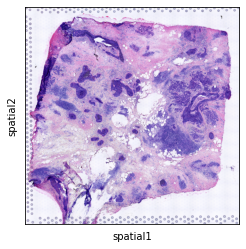

In [10]:
sc.pl.spatial(a)

there are two spicemix related outputs in each samples anndata object:
+ a.uns['metagene_df'] - this is a table with genes as rows and metagenes as columns. the values are the contribution of a particular gene towards a metagene. high values mean those genes are strongly present in a given metagene.
+ a.obsm['metagene_emb'] - a matrix where each row is a spot and each column is a metagene. the values are the metagene scores for each spot. A spot with a high value for a particular metagene means it has relatively strong expression for the genes associated with that metagene. There are also columns in a.obs associated with each metagene, so the spot metagene scores can be easily plotted with scanpy plotting functions.

NOTE: the metagene_df is IDENTICAL for all samples, the metagene_emb is DIFFERENT for each sample.

In [15]:
a.uns['metagene_df']

,metagene_0,metagene_1,metagene_2,metagene_3,metagene_4,metagene_5,metagene_6,metagene_7,metagene_8,metagene_9,metagene_10,metagene_11,metagene_12,metagene_13,metagene_14,metagene_15,metagene_16,metagene_17,metagene_18,metagene_19
gene,,,,,,,,,,,,,,,,,,,,
SAMD11,3.720677e-05,2.425524e-15,0.000040,1.297108e-14,9.067685e-05,0.000003,0.000025,0.000110,1.548137e-05,0.000233,1.942375e-05,3.975115e-15,2.704232e-15,3.665585e-15,9.735420e-15,1.088490e-05,0.000039,2.399139e-05,6.996272e-15,6.460122e-15
NOC2L,5.232210e-15,6.137024e-05,0.000039,1.623243e-04,5.254697e-04,0.000147,0.000146,0.000125,1.592957e-04,0.000125,7.842345e-05,1.247905e-14,1.268120e-04,2.195220e-05,9.151799e-15,2.033153e-04,0.000122,5.628031e-05,2.313686e-04,9.051143e-05
KLHL17,1.342916e-14,1.124448e-06,0.000009,7.703483e-14,1.748685e-04,0.000072,0.000046,0.000025,2.661391e-15,0.000072,6.548577e-05,9.454204e-15,2.790007e-05,2.827798e-05,3.060041e-13,3.822983e-15,0.000003,1.985281e-05,3.040181e-05,4.136752e-14
PLEKHN1,8.433422e-15,1.125217e-06,0.000030,1.616008e-14,3.111596e-05,0.000025,0.000021,0.000020,3.021773e-05,0.000054,2.412282e-06,1.053082e-14,3.769686e-06,1.462556e-14,2.489196e-14,1.776485e-05,0.000024,4.947320e-15,6.779097e-14,8.427953e-15
HES4,2.928584e-15,2.818760e-15,0.000081,5.153963e-14,7.685672e-04,0.000248,0.000147,0.000102,1.644408e-04,0.000455,1.044353e-15,3.251103e-15,9.738553e-05,5.800942e-05,5.889538e-15,6.255006e-04,0.000133,2.144937e-04,2.638768e-04,6.978834e-04
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
CMC4,1.251107e-14,5.297739e-05,0.000060,6.636950e-14,4.721666e-15,0.000085,0.000080,0.000027,5.997286e-05,0.000038,7.148371e-05,2.231508e-14,2.663524e-05,3.407532e-05,2.033661e-05,1.193112e-14,0.000043,4.556100e-05,6.308396e-05,7.205211e-06
VBP1,7.164607e-15,8.351703e-05,0.000056,2.446704e-13,2.939531e-15,0.000129,0.000167,0.000067,7.307535e-05,0.000078,9.274249e-05,1.431773e-14,7.938672e-05,7.652748e-05,2.751651e-14,3.409696e-15,0.000089,6.533978e-05,1.551449e-04,1.771526e-14
CLIC2,4.010497e-14,2.746181e-15,0.000081,2.755690e-14,3.126108e-06,0.000013,0.000011,0.000013,1.694586e-05,0.000012,1.428498e-04,1.437026e-04,1.208759e-05,2.264575e-05,1.837909e-13,3.492732e-06,0.000009,5.730863e-05,9.962203e-15,1.495854e-04


In [16]:
a.obsm['metagene_emb']

array([[1.67364519e-11, 2.00932583e-11, 4.73122593e-09, ...,
        1.83109368e-10, 2.06563354e-11, 1.48756571e-09],
       [4.52009769e-01, 7.00043961e-01, 8.87329273e-01, ...,
        1.47923683e-07, 5.65985865e-11, 9.83987937e-02],
       [6.64352751e-01, 2.71718537e-08, 5.92834152e-01, ...,
        6.16793583e-08, 4.95296507e-02, 7.42510814e-01],
       ...,
       [1.94985609e-11, 8.01929573e-09, 1.09810340e-10, ...,
        3.32695077e-11, 2.82401994e-11, 1.44320054e-01],
       [3.66917314e-12, 1.14087554e-11, 1.11398342e-11, ...,
        1.85400715e-11, 9.10049806e-12, 8.25050687e-12],
       [4.70364867e-01, 4.55088545e-01, 1.38446368e+00, ...,
        6.41554819e-02, 2.48810049e-08, 2.15390934e-02]])

In [17]:
a.obs[[c for c in a.obs.columns if 'metagene' in c]]

,metagene_0,metagene_1,metagene_2,metagene_3,metagene_4,metagene_5,metagene_6,metagene_7,metagene_8,metagene_9,metagene_10,metagene_11,metagene_12,metagene_13,metagene_14,metagene_15,metagene_16,metagene_17,metagene_18,metagene_19
BR_206B1_U1_AAACAAGTATCTCCCA-1,1.673645e-11,2.009326e-11,4.731226e-09,2.628976e-01,1.753726e-11,1.498111,6.645579e-11,3.692693e-11,2.464305e-11,2.387869e-11,1.360566e+00,1.316509e-10,2.648733e-11,2.209788e-02,1.640510e-01,3.739662e+00,2.284042e-11,1.831094e-10,2.065634e-11,1.487566e-09
BR_206B1_U1_AAACAATCTACTAGCA-1,4.520098e-01,7.000440e-01,8.873293e-01,7.078322e-02,3.343970e+00,23.189455,2.732094e+00,1.952537e-11,1.134154e-01,1.034300e-11,2.947144e-09,1.826880e-01,1.833157e-11,4.067118e-12,4.531325e-02,3.791027e-11,6.447603e-11,1.479237e-07,5.659859e-11,9.839879e-02
BR_206B1_U1_AAACACCAATAACTGC-1,6.643528e-01,2.717185e-08,5.928342e-01,3.154395e-02,3.262317e+00,15.748035,2.168251e-01,1.164423e-09,5.007163e-08,8.157968e-09,6.216421e+00,1.525955e+00,4.612589e-09,4.172319e-09,2.726490e-07,1.680742e+00,9.490065e-09,6.167936e-08,4.952965e-02,7.425108e-01
BR_206B1_U1_AAACAGAGCGACTCCT-1,1.878274e-11,2.436876e-11,1.349345e-11,2.378641e-01,2.993293e-12,5.288307,8.138715e-12,6.394482e-12,8.395747e-12,6.211276e-12,4.175692e-11,1.337382e-01,6.135353e-12,4.676042e-08,1.215980e-01,3.380166e+00,7.605455e-12,1.545926e-11,7.252545e-12,1.518874e-11
BR_206B1_U1_AAACAGCTTTCAGAAG-1,8.975176e-01,8.785156e-01,1.993691e+00,2.485879e-11,9.119231e-01,1.476587,1.156980e+01,1.207472e-10,3.927378e+00,4.050171e+00,5.469955e+00,5.471116e-11,1.510231e+00,3.186191e-11,1.651099e-11,1.560913e+00,6.917514e-02,2.522594e+00,1.791798e-10,7.269458e-02
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
BR_206B1_U1_TTGTTGTGTGTCAAGA-1,1.008788e+00,9.468100e-10,1.312846e+00,5.180734e-03,2.174516e-12,3.891274,1.698435e-11,5.103817e-12,6.411308e-12,5.839837e-12,3.599268e+00,2.878299e-12,6.320320e-12,8.191672e-12,4.045474e-01,1.904421e+00,8.499438e-12,5.724240e+00,2.231948e-12,2.203121e+00
BR_206B1_U1_TTGTTTCACATCCAGG-1,3.751468e-01,2.856878e-01,1.412906e-01,1.127069e-02,3.721092e+00,23.626784,1.960053e+00,1.960645e-10,1.340563e-01,7.501168e-03,5.839331e-01,3.344754e-01,1.730195e-10,2.456844e-10,3.147972e-02,4.053178e-01,1.589727e-09,5.601359e-02,4.415557e-10,1.360844e-01
BR_206B1_U1_TTGTTTCATTAGTCTA-1,1.949856e-11,8.019296e-09,1.098103e-10,9.886836e-02,1.681933e+00,9.897508,1.567513e-11,5.689635e-10,7.387231e-11,6.542387e-11,1.754616e-09,2.247662e-01,3.333778e-11,9.343185e-02,8.431592e-11,4.499034e+00,1.091814e-10,3.326951e-11,2.824020e-11,1.443201e-01
BR_206B1_U1_TTGTTTCCATACAACT-1,3.669173e-12,1.140876e-11,1.113983e-11,3.519652e-01,8.805850e-12,3.865993,1.036082e-11,9.524320e-12,8.458475e-12,1.010297e-11,4.890555e-07,3.982678e-12,8.263090e-12,1.958383e-02,1.098498e-01,4.116109e+00,5.422123e-12,1.854007e-11,9.100498e-12,8.250507e-12


here we plot the metagene scores for all spots in a sample

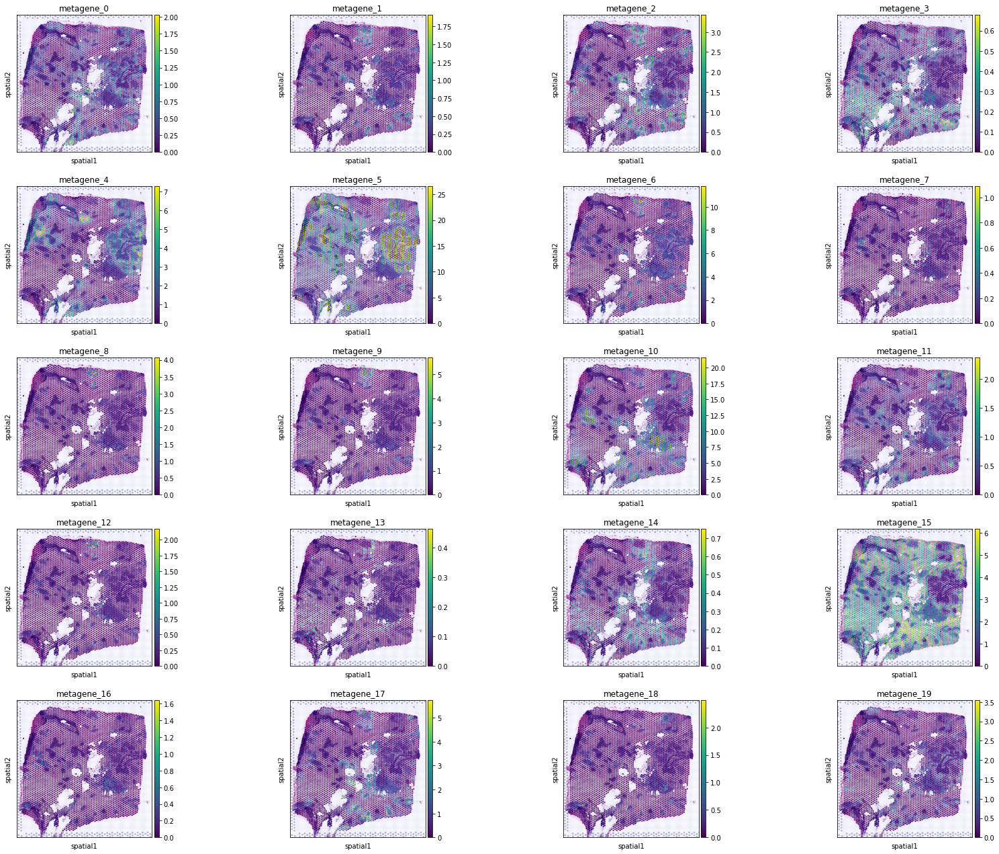

In [18]:
sc.pl.spatial(a, color=[c for c in a.obs.columns if 'metagene' in c])

example of searching for which genes are most associated with which metagenes

In [19]:
from sklearn.preprocessing import StandardScaler
def get_top_metagenes(metagene_df, gene):
    scaler = StandardScaler(with_mean=False)
    scaled = pd.DataFrame(data=scaler.fit_transform(metagene_df.values),
                          index=metagene_df.index, columns=metagene_df.columns).transpose()
    
    if gene not in scaled.columns:
        raise RuntimeError(f'{gene} not in analysis, filtered due to sparsity across samples')
    
    return scaled.sort_values(gene, ascending=False)[gene]

In [21]:
get_top_metagenes(a.uns['metagene_df'], 'MGP')

metagene_3     1.854188e+01
metagene_2     9.112043e+00
metagene_1     8.815947e+00
metagene_15    7.238651e+00
metagene_17    6.712349e+00
metagene_12    6.454944e+00
metagene_6     5.860102e+00
metagene_9     5.640630e+00
metagene_13    5.583896e+00
metagene_18    4.530293e+00
metagene_0     3.877466e+00
metagene_5     3.712805e+00
metagene_14    2.659114e+00
metagene_8     2.417627e+00
metagene_19    1.816420e+00
metagene_10    1.370676e+00
metagene_11    4.818244e-11
metagene_7     1.099579e-11
metagene_4     7.813864e-12
metagene_16    4.376851e-12
Name: MGP, dtype: float64

BR_206B1_U1


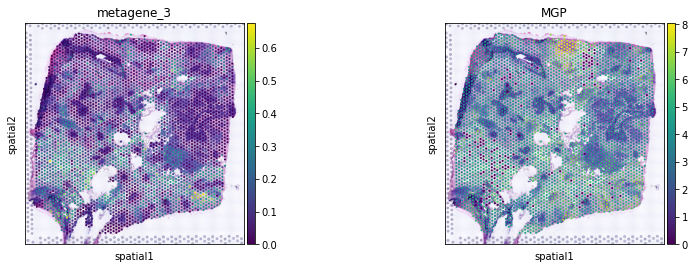

BR_206B1_U2


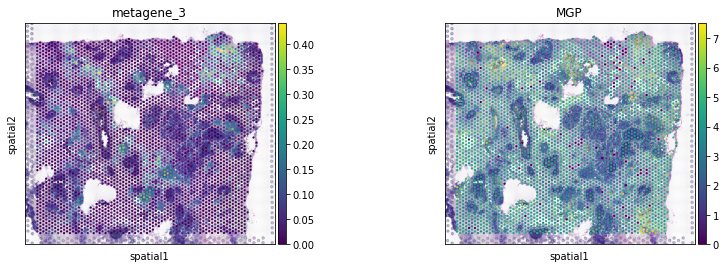

BR_206B1_U3


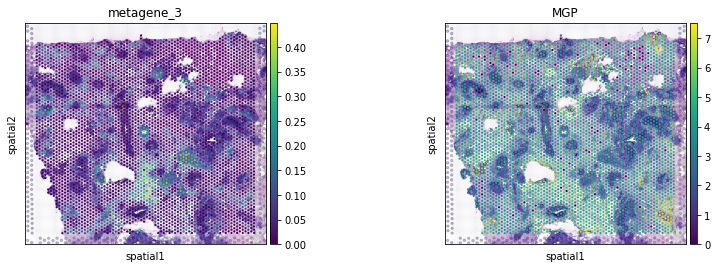

BR_206B1_U4


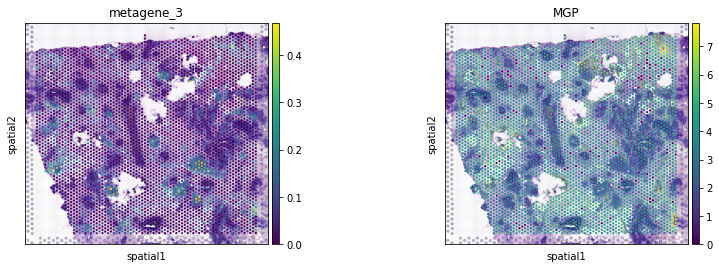

BR_206B1_U5


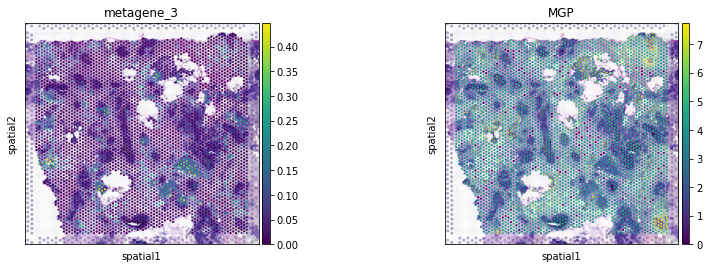

HT308B1-S1H1


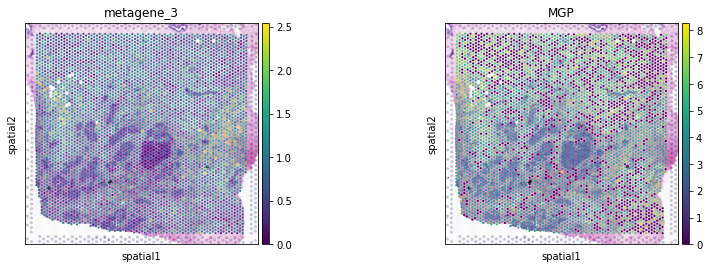

HT308B1-S1H4


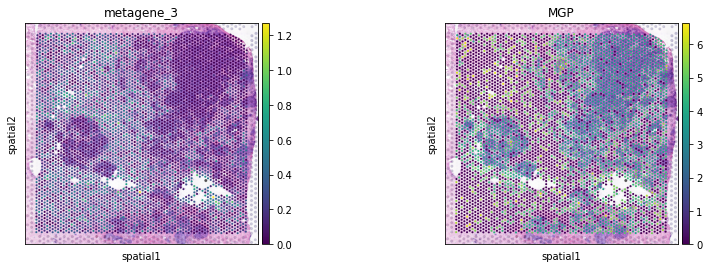

HT308B1-S1H5


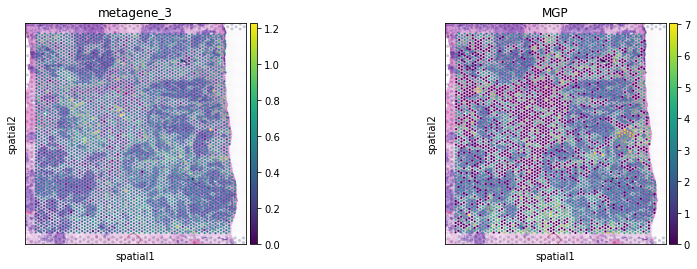

HT308B1-S2H5


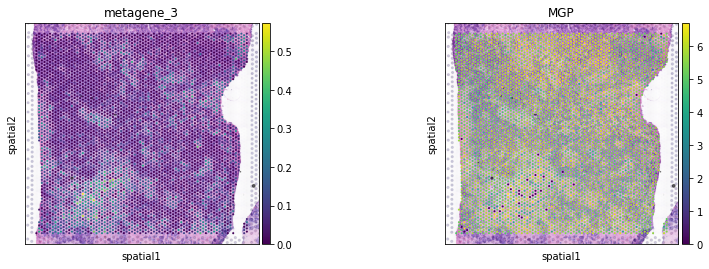

HT323B1-S1H1


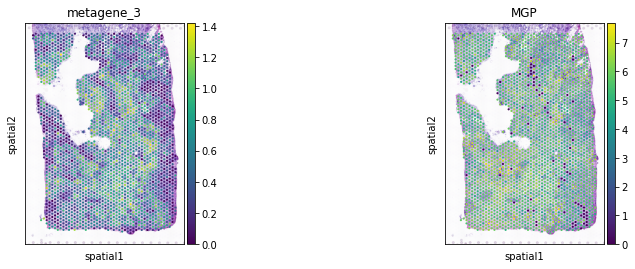

HT323B1-S1H3


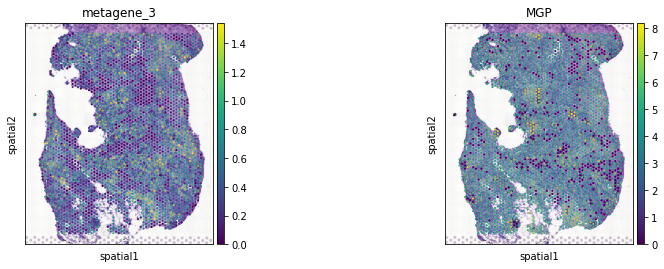

HT339B1-S1H3_U1


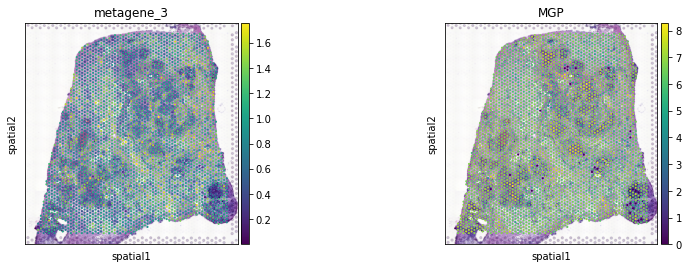

HT339B1-S1H3_U2


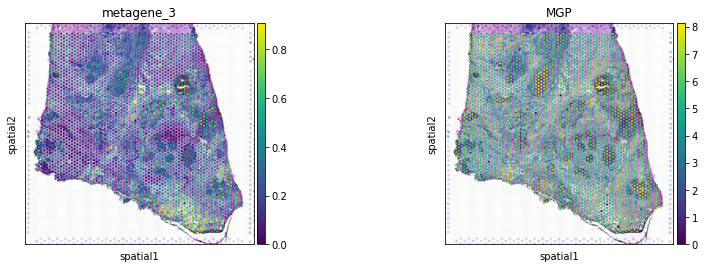

HT397B1-S1H2Fs4U1Bp1


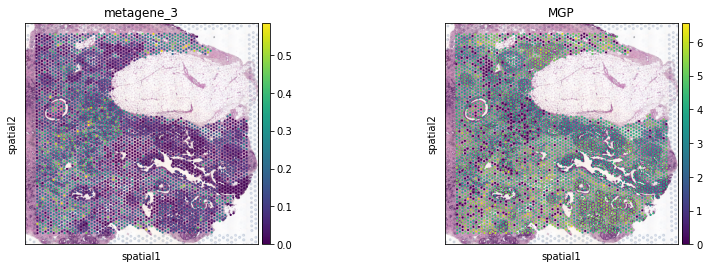

HT397B1-S1H3Fs1U1Bp1


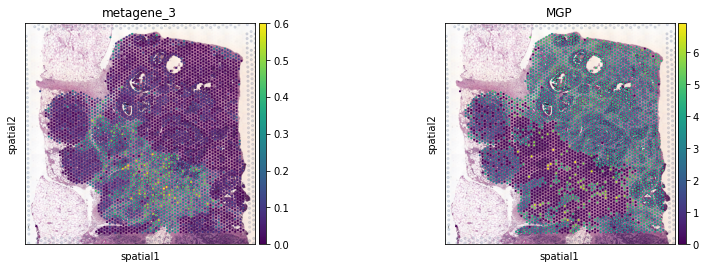

HT480B1-S1H1Fs1U1Bp1


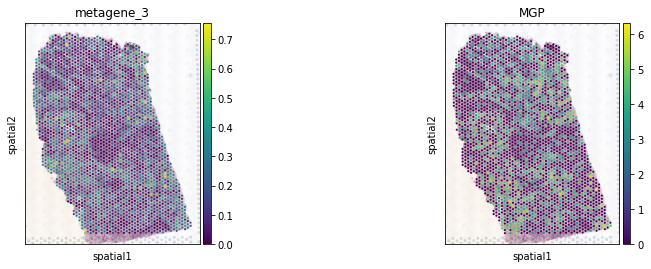

HT480B1-S1H3Fs1U1Bp1


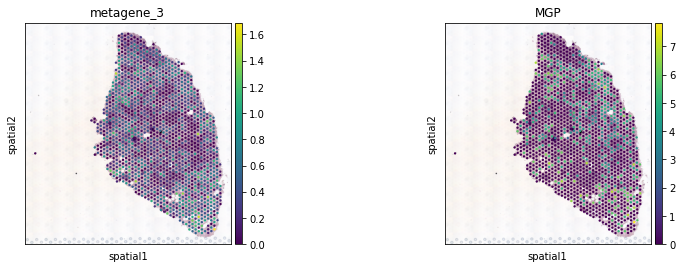

HT486B1-S1H1Fs1U1Bp1


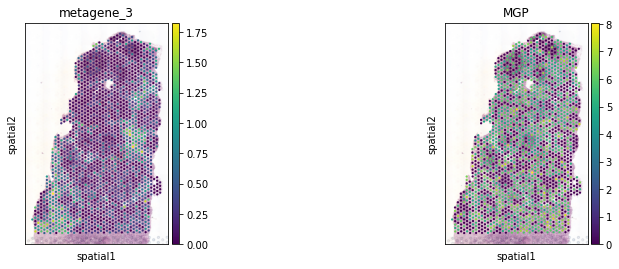

In [24]:
for s, a in sample_to_adata.items():
    print(s)
    sc.pl.spatial(a, color=['metagene_3', 'MGP'])

top genes for a particular metagene plus pathway analysis

In [25]:
n = 20
a.uns['metagene_df'].sort_values('metagene_3', ascending=False).index[:n]

Index(['COL1A2', 'COL1A1', 'B2M', 'IGKC', 'ACTB', 'FTH1', 'FTL', 'SPARC',
       'FN1', 'MGP', 'COL3A1', 'TMSB4X', 'IGFBP7', 'PSAP', 'UBC', 'IFITM3',
       'CD74', 'PTMA', 'CTSD', 'HLA-DRA'],
      dtype='object', name='gene')

In [27]:
df = een.get_pathway_enrichment(
    a.uns['metagene_df'].sort_values('metagene_3', ascending=False).index[:n],
    gene_set_library='GO_Biological_Process_2021')
epl.enrichment_dotplot(df, n=20)

alt.LayerChart(...)

In [28]:
n = 20
a.uns['metagene_df'].sort_values('metagene_5', ascending=False).index[:n]

Index(['MMP7', 'PTMA', 'KRT81', 'CD24', 'KRT14', 'COX6C', 'UBA52', 'GABRP',
       'S100P', 'CXCL14', 'EEF2', 'PHGDH', 'RACK1', 'FABP5', 'HMGB1',
       'ATP5F1E', 'H3F3A', 'UQCRB', 'SLPI', 'COX6A1'],
      dtype='object', name='gene')

In [29]:
df = een.get_pathway_enrichment(
    a.uns['metagene_df'].sort_values('metagene_5', ascending=False).index[:n],
    gene_set_library='GO_Biological_Process_2021')
epl.enrichment_dotplot(df, n=20)

alt.LayerChart(...)

BR_206B1_U1


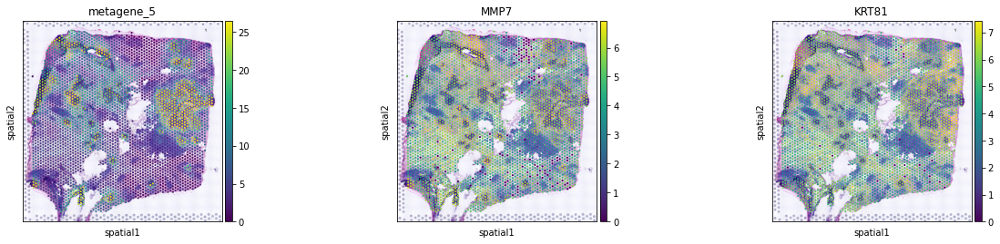

BR_206B1_U2


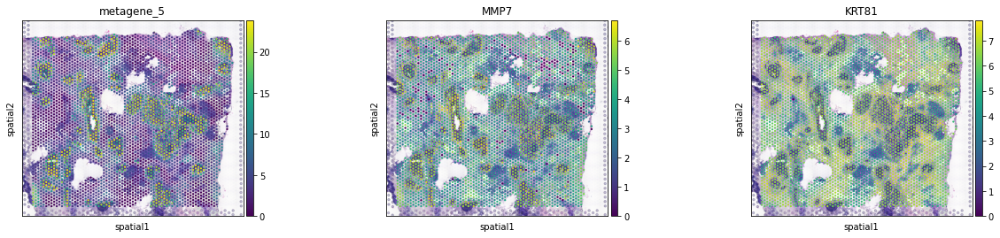

BR_206B1_U3


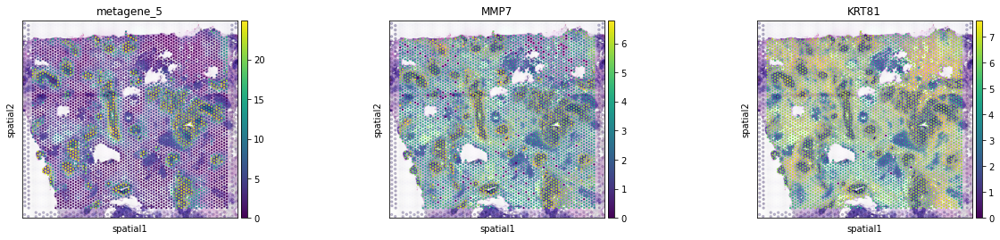

BR_206B1_U4


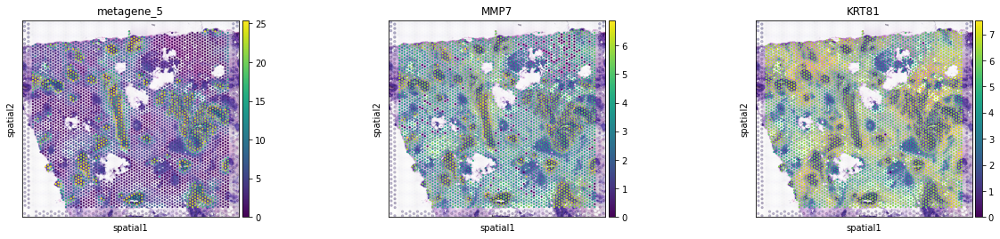

BR_206B1_U5


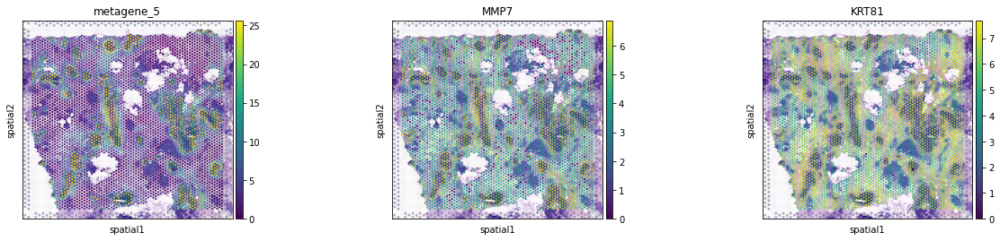

HT308B1-S1H1


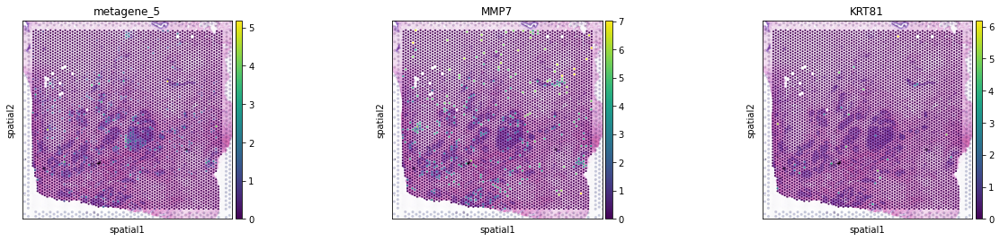

HT308B1-S1H4


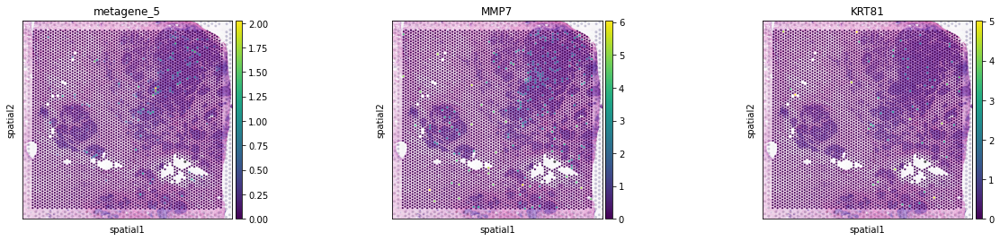

HT308B1-S1H5


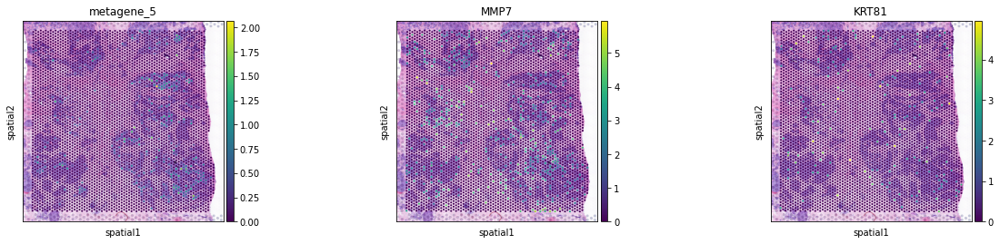

HT308B1-S2H5


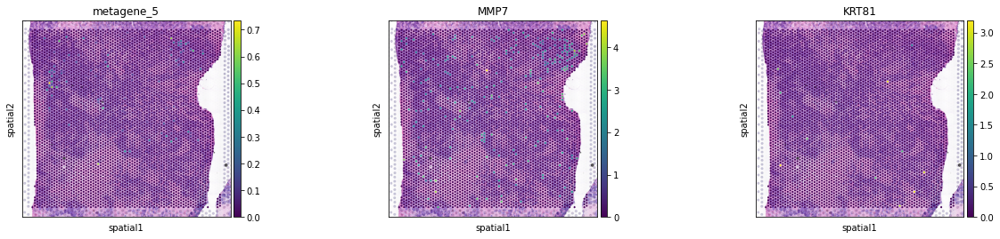

HT323B1-S1H1


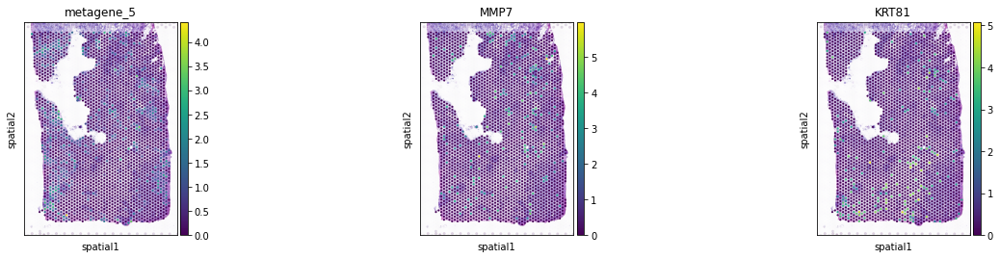

HT323B1-S1H3


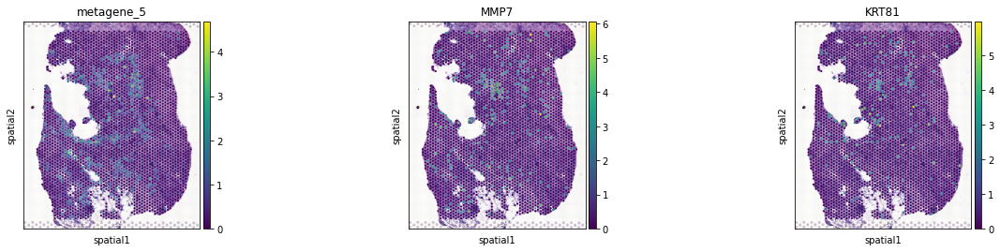

HT339B1-S1H3_U1


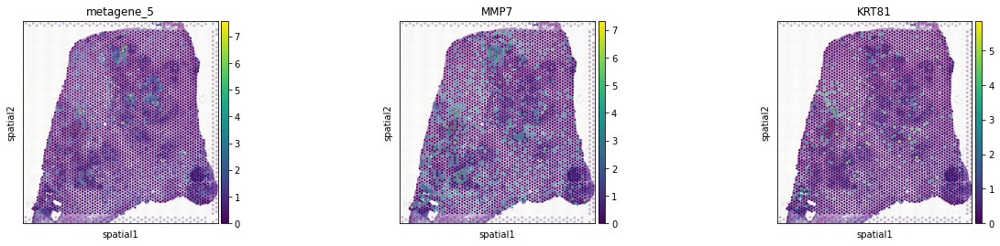

HT339B1-S1H3_U2


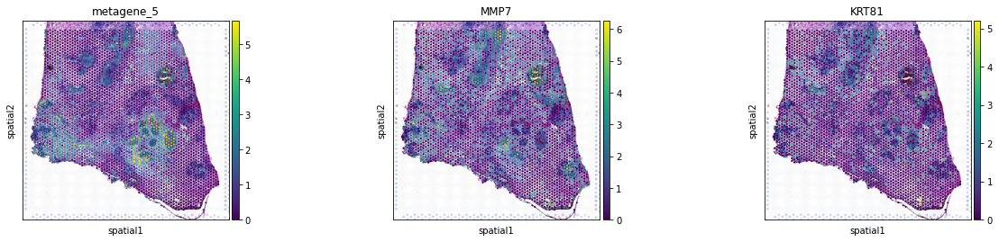

HT397B1-S1H2Fs4U1Bp1


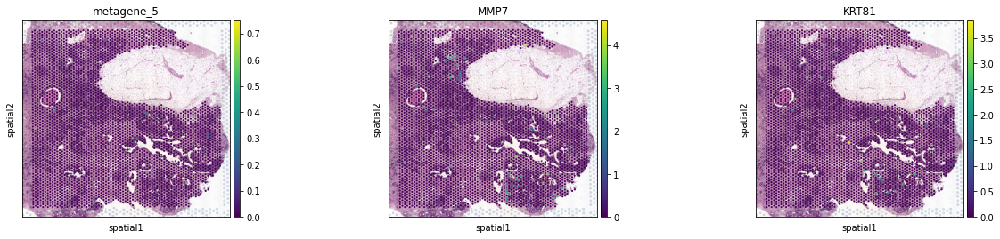

HT397B1-S1H3Fs1U1Bp1


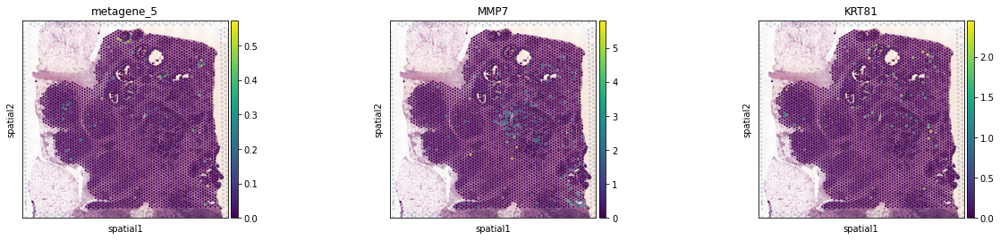

HT480B1-S1H1Fs1U1Bp1


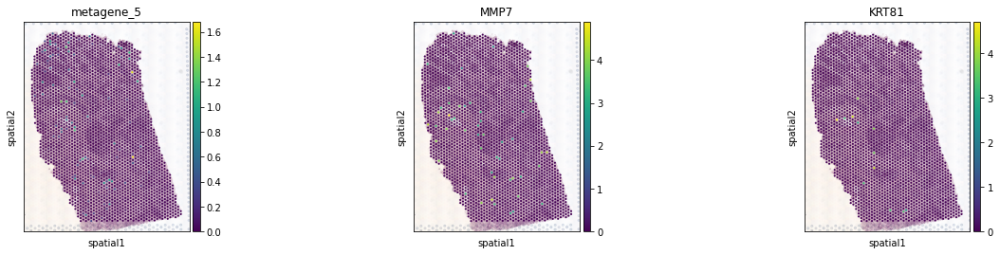

HT480B1-S1H3Fs1U1Bp1


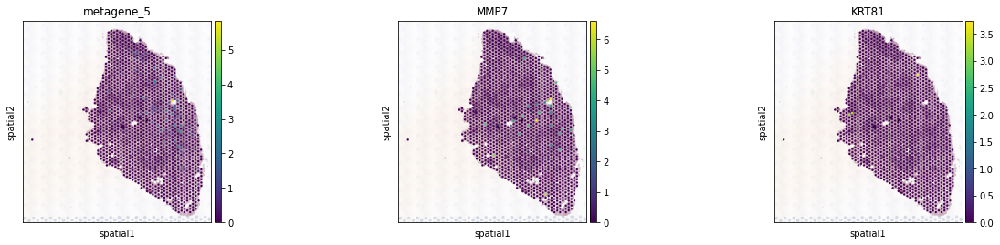

HT486B1-S1H1Fs1U1Bp1


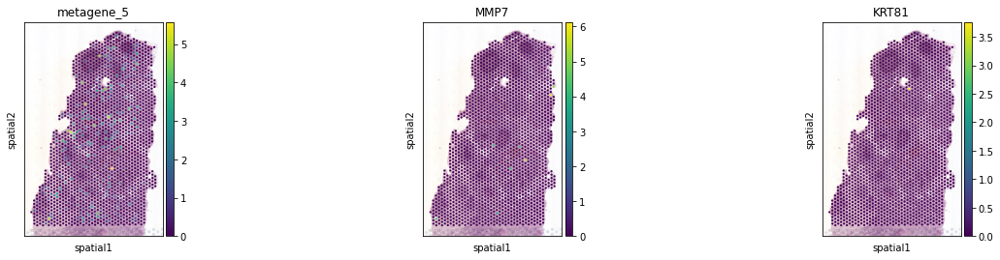

In [33]:
for s, a in sample_to_adata.items():
    print(s)
    sc.pl.spatial(a, color=['metagene_5', 'MMP7', 'KRT81'])